Change value of `STEP`.

In [1]:
import os

STEP = 1
output_dir = f"output/Step{STEP}"
os.makedirs(output_dir, exist_ok=True)

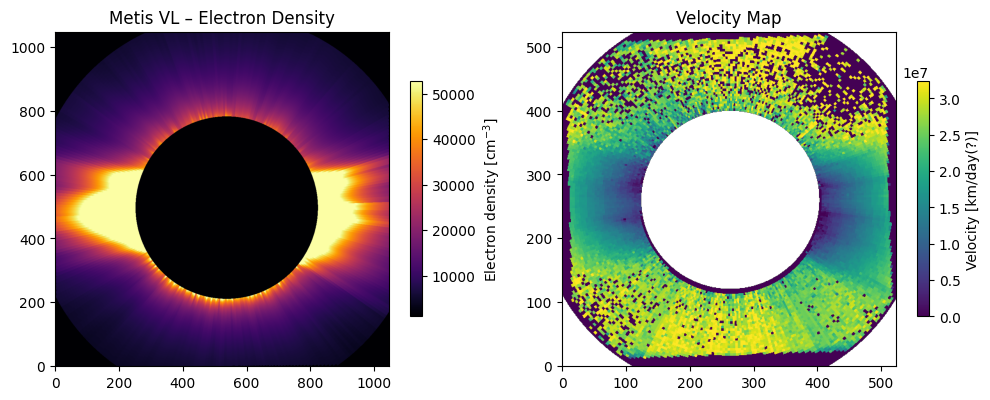

In [2]:
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
import sys

# ------------------------------
# --- Step 1: Load FITS data ---
# ------------------------------

# Paths to FITS files
density_fits  = f"data/solo_L2_metis-vl-pb_20210114T003001_V01_1_0.71_ne.fits"
if STEP == 0:
    velocity_fits = f"data/Step{STEP}/ddt_ws_20210114T004530_Gi_10_100_1.fits" # to obtain this, DDT uses Gibson+99 temperature profiles along all latitudes
elif STEP == 1:
    velocity_fits = f"data/Step{STEP}/ddt_ws_20210114T004530_0{STEP-1}_10_100_1.fits"
else:
    print("You need the Solar wind map from the previous cycle.")
    sys.exit(0)
    
# Open electron density FITS
with fits.open(density_fits) as hdul_den:
    den_data = hdul_den[0].data
    den_header = hdul_den[0].header

# Open velocity FITS
with fits.open(velocity_fits) as hdul_vel:
    vel_data = hdul_vel[0].data
    vel_header = hdul_vel[0].header

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Electron density plot
im0 = axes[0].imshow(
    den_data,
    origin="lower",
    cmap="inferno",
    vmin=np.nanpercentile(den_data, 5),
    vmax=np.nanpercentile(den_data, 95)
)
axes[0].set_title("Metis VL – Electron Density")
cbar0 = plt.colorbar(im0, ax=axes[0], shrink=0.5)
cbar0.set_label("Electron density [cm$^{-3}$]")

# Velocity map plot
im1 = axes[1].imshow(
    vel_data,
    origin="lower",
    cmap="viridis",
    vmin=np.nanpercentile(vel_data, 5),
    vmax=np.nanpercentile(vel_data, 95)
)
axes[1].set_title("Velocity Map")
cbar1 = plt.colorbar(im1, ax=axes[1], shrink=0.5)
cbar1.set_label("Velocity [km/day(?)]")

plt.tight_layout()

# Save
output_subdir = "input_data"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/ne_and_u.png"

plt.savefig(outfile, dpi=300)

plt.show()
plt.close()

In [3]:
from scipy.ndimage import zoom, map_coordinates, shift
from astropy.stats import sigma_clip

output_subdir = "lat"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)

# -------------------------------------------------
# --- Latitude range ------------------------------
# -------------------------------------------------
latitude_min  = 0.    # [deg]
latitude_max  = 360.  # [deg]
latitude_step = 1.    # [deg]

lat_obs_vec = []
r_obs_vec   = []
ne_obs_vec  = []
u_obs_vec   = []

print("Considered latitudes:")
for latitude_val in np.arange(latitude_min, latitude_max, latitude_step):

    print("--"*10)
    print(f"Latitude: {latitude_val} deg")

    # -------------------------------------------------
    # --- Step 2: Resize & shift density map ----------
    # -------------------------------------------------
    zoom_y = vel_data.shape[0] / den_data.shape[0]
    zoom_x = vel_data.shape[1] / den_data.shape[1]
    den_data_resized = zoom(den_data, (zoom_y, zoom_x), order=1)

    cx_den_resized = den_header["SUN_XCEN"] * zoom_x
    cy_den_resized = den_header["SUN_YCEN"] * zoom_y
    cx_vel, cy_vel = vel_header["XCEN"], vel_header["YCEN"]

    shift_x = cx_vel - cx_den_resized
    shift_y = cy_vel - cy_den_resized
    den_data_resized = shift(den_data_resized, shift=(shift_y, shift_x), order=1)

    cx_den_resized += shift_x
    cy_den_resized += shift_y

    if not (cx_den_resized == cx_vel and cy_den_resized == cy_vel):
        sys.exit("ATTENTION! Images not aligned!")

    print("Images resized & Sun-center aligned!")

    # -------------------------------------------------
    # --- Occulter & annulus --------------------------
    # -------------------------------------------------
    io_cx, io_cy = den_header["IO_XCEN"], den_header["IO_YCEN"]
    r_inner, r_outer = 300, 500  # pixels (original density)

    io_cx_resized = io_cx * zoom_x + shift_x
    io_cy_resized = io_cy * zoom_y + shift_y
    r_inner_resized = r_inner * zoom_x
    r_outer_resized = r_outer * zoom_x

    def annular_mask(shape, cx, cy, r_in, r_out):
        y, x = np.indices(shape)
        r = np.sqrt((x - cx)**2 + (y - cy)**2)
        return (r >= r_in) & (r <= r_out)

    mask_den = annular_mask(den_data_resized.shape, io_cx_resized, io_cy_resized,
                            r_inner_resized, r_outer_resized)
    mask_vel = annular_mask(vel_data.shape, io_cx_resized, io_cy_resized,
                            r_inner_resized, r_outer_resized)

    den_data_masked = np.where(mask_den, den_data_resized, np.nan)
    vel_data_masked = np.where(mask_vel, vel_data, np.nan)

    # -------------------------------------------------
    # --- Radial extraction ---------------------------
    # -------------------------------------------------
    def radial_from_center(data, cx, cy, start_radius=0, angle_deg=0):
        theta = np.deg2rad(angle_deg)
        
        dx_pos = (data.shape[1]-1 - cx) / np.cos(theta) if np.cos(theta) > 0 else np.inf
        dx_neg = -cx / np.cos(theta) if np.cos(theta) < 0 else np.inf
        dy_pos = (data.shape[0]-1 - cy) / np.sin(theta) if np.sin(theta) > 0 else np.inf
        dy_neg = -cy / np.sin(theta) if np.sin(theta) < 0 else np.inf
        max_radius = int(np.floor(min(dx_pos, dx_neg, dy_pos, dy_neg)))
        
        r_vals = np.arange(start_radius, max_radius)
        x = cx + r_vals * np.cos(theta)
        y = cy + r_vals * np.sin(theta)
        radial = map_coordinates(data, [y, x], order=1, mode='nearest')
        return r_vals, radial


    angle_deg = latitude_val

    r_den, radial_den = radial_from_center(den_data_masked, cx_den_resized, cy_den_resized,
                                           start_radius=r_inner_resized,
                                           angle_deg=angle_deg)

    r_vel, radial_vel = radial_from_center(vel_data_masked, cx_vel, cy_vel,
                                           start_radius=r_inner_resized,
                                           angle_deg=angle_deg)

    # -------------------------------------------------
    # --- Pixel → Rsun --------------------------------
    # -------------------------------------------------
    Rsun_pixels_den = den_header["RSUN"] * zoom_x
    Rsun_pixels_vel = vel_header["RSUN"]

    h_den_Rsun = r_den / Rsun_pixels_den - 1
    h_vel_Rsun = r_vel / Rsun_pixels_vel - 1

    # -------------------------------------------------
    # --- Step 6: ROBUST observed point ----------------
    # -------------------------------------------------
    delta_r = 0.25  # [Rsun]

    r_inner_Rsun = (r_inner * zoom_x / Rsun_pixels_den) - 1
    r_outer_Rsun = (r_outer * zoom_x / Rsun_pixels_den) - 1
    r_target = 0.5 * (r_inner_Rsun + r_outer_Rsun)

    # --- Density (robust)
    mask_den_r = np.abs(h_den_Rsun - r_target) < delta_r
    ne_slice = radial_den[mask_den_r]
    ne_slice = ne_slice[np.isfinite(ne_slice) & (ne_slice > 0)]

    if len(ne_slice) < 3:
        ne_obs = np.nan
        print("WARNING: too few density points")
    else:
        ne_clip = sigma_clip(ne_slice, sigma=3, maxiters=5)
        ne_obs = np.nanmedian(ne_clip)
        if not ne_obs > 0:
            ne_obs = np.nanmean(ne_clip)

    # --- Velocity (robust)
    mask_vel_r = np.abs(h_vel_Rsun - r_target) < delta_r
    u_slice = radial_vel[mask_vel_r]
    u_slice = u_slice[np.isfinite(u_slice) & (u_slice > 0)]

    if len(u_slice) < 3:
        u_obs = np.nan
        print("WARNING: too few velocity points")
    else:
        u_clip = sigma_clip(u_slice, sigma=3, maxiters=5)
        u_obs = np.nanmedian(u_clip)
        if not u_obs > 0:
            u_obs = np.nanmean(u_clip)
    
    r_obs = r_target
    
    print(f"r_obs={r_obs:.2f} Rsun | ne_obs={ne_obs:.2e} | u_obs={u_obs:.2e}")
    
    # -------------------------------------------------
    # --- Step 7: Plots --------------------------------
    # -------------------------------------------------
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    
    # Density map
    im0 = axes[0,0].imshow(den_data_masked, origin='lower', cmap='inferno')
    axes[0,0].scatter(cx_den_resized, cy_den_resized,
                      facecolors='none', edgecolors='green',
                      s=80, linewidths=2, label='Sun center')
    axes[0,0].plot(cx_den_resized + r_den*np.cos(np.deg2rad(angle_deg)),
                   cy_den_resized + r_den*np.sin(np.deg2rad(angle_deg)),
                   '--', color='cyan', label='Radial')
    axes[0,0].set_title("Electron Density map")
    axes[0,0].set_xlabel("Pixel")
    axes[0,0].set_ylabel("Pixel")
    fig.colorbar(im0, ax=axes[0,0], shrink=0.8, label=r"n$_e$ [cm$^{-3}$]")
    axes[0,0].legend()
    
    # Velocity map
    im1 = axes[0,1].imshow(vel_data_masked, origin='lower', cmap='viridis')
    axes[0,1].scatter(cx_vel, cy_vel,
                      facecolors='none', edgecolors='green',
                      s=80, linewidths=2, label='Sun center')
    axes[0,1].plot(cx_vel + r_vel*np.cos(np.deg2rad(angle_deg)),
                   cy_vel + r_vel*np.sin(np.deg2rad(angle_deg)),
                   '--', color='cyan', label='Radial')
    axes[0,1].set_title("Velocity map")
    axes[0,1].set_xlabel("Pixel")
    axes[0,1].set_ylabel("Pixel")
    fig.colorbar(im1, ax=axes[0,1], shrink=0.8, label="v [cm/s]")
    axes[0,1].legend()
    
    # Density radial
    axes[1,0].plot(h_den_Rsun, radial_den, '.', label='Radial profile')
    axes[1,0].axvspan(r_target-delta_r, r_target+delta_r,
                      color='orange', alpha=0.25, label=r'$\Delta r$ window')
    axes[1,0].plot(r_obs, ne_obs, 'o', color='red', label='Robust $n_e$')
    axes[1,0].set_xlabel("Distance from solar surface [R$_sun$]")
    axes[1,0].set_ylabel(r"n$_e$ [cm$^{-3}$]")
    axes[1,0].grid(ls='--', alpha=0.4)
    axes[1,0].legend()
    
    # Velocity radial
    axes[1,1].plot(h_vel_Rsun, radial_vel, '.', label='Radial profile')
    axes[1,1].axvspan(r_target-delta_r, r_target+delta_r,
                      color='orange', alpha=0.25, label=r'$\Delta r$ window')
    axes[1,1].plot(r_obs, u_obs, 'o', color='red', label='Robust $u$')
    axes[1,1].set_xlabel("Distance from solar surface [R$_sun$]")
    axes[1,1].set_ylabel("Velocity [cm/s]")
    axes[1,1].grid(ls='--', alpha=0.4)
    axes[1,1].legend()
    
    plt.tight_layout()
    outfile = f"{output_dir}/{output_subdir}/lat_{latitude_val:.1f}deg.png"
    plt.savefig(outfile, dpi=300)
    plt.close()

    print(f"Figure saved: {outfile}")
    
    # -------------------------------------------------
    # --- Save values ---------------------------------
    # -------------------------------------------------
    lat_obs_vec.append(np.deg2rad(angle_deg))
    r_obs_vec.append(r_obs)
    ne_obs_vec.append(ne_obs)
    u_obs_vec.append(u_obs)

plt.show()
plt.close()
print("--"*10)

Considered latitudes:
--------------------
Latitude: 0.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.33e+04 | u_obs=1.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_0.0deg.png
--------------------
Latitude: 1.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.37e+04 | u_obs=1.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_1.0deg.png
--------------------
Latitude: 2.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.86e+04 | u_obs=1.36e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_2.0deg.png
--------------------
Latitude: 3.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.20e+04 | u_obs=1.32e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_3.0deg.png
--------------------
Latitude: 4.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.99e+04 | u_obs=1.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_4.0deg.png
--------------------
Latitude: 5.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.83e+04 | u_obs=1.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_5.0deg.png
--------------------
Latitude: 6.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.82e+04 | u_obs=1.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_6.0deg.png
--------------------
Latitude: 7.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.90e+04 | u_obs=1.29e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_7.0deg.png
--------------------
Latitude: 8.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.01e+04 | u_obs=1.30e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_8.0deg.png
--------------------
Latitude: 9.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.26e+04 | u_obs=1.34e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_9.0deg.png
--------------------
Latitude: 10.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.50e+04 | u_obs=1.45e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_10.0deg.png
--------------------
Latitude: 11.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.67e+04 | u_obs=1.46e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_11.0deg.png
--------------------
Latitude: 12.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.72e+04 | u_obs=1.48e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_12.0deg.png
--------------------
Latitude: 13.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.66e+04 | u_obs=1.51e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_13.0deg.png
--------------------
Latitude: 14.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.39e+04 | u_obs=1.55e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_14.0deg.png
--------------------
Latitude: 15.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.36e+04 | u_obs=1.64e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_15.0deg.png
--------------------
Latitude: 16.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.61e+04 | u_obs=1.69e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_16.0deg.png
--------------------
Latitude: 17.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.55e+04 | u_obs=1.75e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_17.0deg.png
--------------------
Latitude: 18.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.87e+04 | u_obs=1.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_18.0deg.png
--------------------
Latitude: 19.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.15e+04 | u_obs=1.86e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_19.0deg.png
--------------------
Latitude: 20.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.63e+04 | u_obs=2.03e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_20.0deg.png
--------------------
Latitude: 21.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.30e+04 | u_obs=2.14e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_21.0deg.png
--------------------
Latitude: 22.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.08e+04 | u_obs=2.22e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_22.0deg.png
--------------------
Latitude: 23.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.91e+04 | u_obs=2.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_23.0deg.png
--------------------
Latitude: 24.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.79e+04 | u_obs=2.28e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_24.0deg.png
--------------------
Latitude: 25.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.73e+04 | u_obs=2.49e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_25.0deg.png
--------------------
Latitude: 26.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.71e+04 | u_obs=2.55e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_26.0deg.png
--------------------
Latitude: 27.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.64e+04 | u_obs=2.63e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_27.0deg.png
--------------------
Latitude: 28.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.54e+04 | u_obs=2.85e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_28.0deg.png
--------------------
Latitude: 29.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.49e+04 | u_obs=2.83e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_29.0deg.png
--------------------
Latitude: 30.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.43e+04 | u_obs=2.78e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_30.0deg.png
--------------------
Latitude: 31.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.36e+04 | u_obs=2.73e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_31.0deg.png
--------------------
Latitude: 32.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.31e+04 | u_obs=1.81e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_32.0deg.png
--------------------
Latitude: 33.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=2.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_33.0deg.png
--------------------
Latitude: 34.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.81e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_34.0deg.png
--------------------
Latitude: 35.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=2.16e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_35.0deg.png
--------------------
Latitude: 36.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=1.87e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_36.0deg.png
--------------------
Latitude: 37.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=2.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_37.0deg.png
--------------------
Latitude: 38.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=3.01e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_38.0deg.png
--------------------
Latitude: 39.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=2.71e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_39.0deg.png
--------------------
Latitude: 40.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=2.71e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_40.0deg.png
--------------------
Latitude: 41.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=2.07e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_41.0deg.png
--------------------
Latitude: 42.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=2.23e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_42.0deg.png
--------------------
Latitude: 43.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=1.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_43.0deg.png
--------------------
Latitude: 44.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=1.43e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_44.0deg.png
--------------------
Latitude: 45.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.03e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_45.0deg.png
--------------------
Latitude: 46.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.74e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_46.0deg.png
--------------------
Latitude: 47.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=1.68e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_47.0deg.png
--------------------
Latitude: 48.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.82e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_48.0deg.png
--------------------
Latitude: 49.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=1.32e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_49.0deg.png
--------------------
Latitude: 50.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=8.71e+06


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_50.0deg.png
--------------------
Latitude: 51.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.21e+04 | u_obs=2.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_51.0deg.png
--------------------
Latitude: 52.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.21e+04 | u_obs=1.46e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_52.0deg.png
--------------------
Latitude: 53.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=1.37e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_53.0deg.png
--------------------
Latitude: 54.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=1.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_54.0deg.png
--------------------
Latitude: 55.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.73e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_55.0deg.png
--------------------
Latitude: 56.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=2.58e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_56.0deg.png
--------------------
Latitude: 57.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=1.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_57.0deg.png
--------------------
Latitude: 58.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=1.51e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_58.0deg.png
--------------------
Latitude: 59.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=1.15e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_59.0deg.png
--------------------
Latitude: 60.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=1.61e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_60.0deg.png
--------------------
Latitude: 61.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.99e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_61.0deg.png
--------------------
Latitude: 62.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=2.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_62.0deg.png
--------------------
Latitude: 63.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=1.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_63.0deg.png
--------------------
Latitude: 64.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=1.89e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_64.0deg.png
--------------------
Latitude: 65.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.88e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_65.0deg.png
--------------------
Latitude: 66.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=3.08e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_66.0deg.png
--------------------
Latitude: 67.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=3.12e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_67.0deg.png
--------------------
Latitude: 68.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.30e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_68.0deg.png
--------------------
Latitude: 69.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=2.25e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_69.0deg.png
--------------------
Latitude: 70.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.03e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_70.0deg.png
--------------------
Latitude: 71.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.21e+04 | u_obs=3.04e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_71.0deg.png
--------------------
Latitude: 72.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.17e+04 | u_obs=2.85e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_72.0deg.png
--------------------
Latitude: 73.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.18e+04 | u_obs=1.70e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_73.0deg.png
--------------------
Latitude: 74.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=2.96e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_74.0deg.png
--------------------
Latitude: 75.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.82e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_75.0deg.png
--------------------
Latitude: 76.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.54e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_76.0deg.png
--------------------
Latitude: 77.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=2.75e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_77.0deg.png
--------------------
Latitude: 78.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=2.84e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_78.0deg.png
--------------------
Latitude: 79.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=2.07e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_79.0deg.png
--------------------
Latitude: 80.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.31e+04 | u_obs=2.70e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_80.0deg.png
--------------------
Latitude: 81.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.31e+04 | u_obs=2.20e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_81.0deg.png
--------------------
Latitude: 82.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.32e+04 | u_obs=1.86e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_82.0deg.png
--------------------
Latitude: 83.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.32e+04 | u_obs=3.12e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_83.0deg.png
--------------------
Latitude: 84.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.30e+04 | u_obs=2.95e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_84.0deg.png
--------------------
Latitude: 85.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.30e+04 | u_obs=2.80e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_85.0deg.png
--------------------
Latitude: 86.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=2.97e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_86.0deg.png
--------------------
Latitude: 87.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.60e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_87.0deg.png
--------------------
Latitude: 88.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=2.56e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_88.0deg.png
--------------------
Latitude: 89.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=2.18e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_89.0deg.png
--------------------
Latitude: 90.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=2.86e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_90.0deg.png
--------------------
Latitude: 91.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.09e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_91.0deg.png
--------------------
Latitude: 92.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=3.17e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_92.0deg.png
--------------------
Latitude: 93.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.73e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_93.0deg.png
--------------------
Latitude: 94.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=2.75e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_94.0deg.png
--------------------
Latitude: 95.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.30e+04 | u_obs=2.11e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_95.0deg.png
--------------------
Latitude: 96.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=3.21e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_96.0deg.png
--------------------
Latitude: 97.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=2.80e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_97.0deg.png
--------------------
Latitude: 98.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=1.80e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_98.0deg.png
--------------------
Latitude: 99.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=3.01e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_99.0deg.png
--------------------
Latitude: 100.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=3.19e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_100.0deg.png
--------------------
Latitude: 101.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=2.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_101.0deg.png
--------------------
Latitude: 102.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.31e+04 | u_obs=2.20e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_102.0deg.png
--------------------
Latitude: 103.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.29e+04 | u_obs=2.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_103.0deg.png
--------------------
Latitude: 104.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.30e+04 | u_obs=2.77e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_104.0deg.png
--------------------
Latitude: 105.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.33e+04 | u_obs=2.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_105.0deg.png
--------------------
Latitude: 106.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.36e+04 | u_obs=2.54e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_106.0deg.png
--------------------
Latitude: 107.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.37e+04 | u_obs=1.87e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_107.0deg.png
--------------------
Latitude: 108.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.39e+04 | u_obs=1.59e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_108.0deg.png
--------------------
Latitude: 109.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.37e+04 | u_obs=2.72e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_109.0deg.png
--------------------
Latitude: 110.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.33e+04 | u_obs=2.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_110.0deg.png
--------------------
Latitude: 111.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.32e+04 | u_obs=2.59e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_111.0deg.png
--------------------
Latitude: 112.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.33e+04 | u_obs=2.68e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_112.0deg.png
--------------------
Latitude: 113.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.36e+04 | u_obs=2.78e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_113.0deg.png
--------------------
Latitude: 114.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.58e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_114.0deg.png
--------------------
Latitude: 115.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_115.0deg.png
--------------------
Latitude: 116.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.37e+04 | u_obs=2.63e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_116.0deg.png
--------------------
Latitude: 117.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.36e+04 | u_obs=2.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_117.0deg.png
--------------------
Latitude: 118.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.34e+04 | u_obs=1.72e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_118.0deg.png
--------------------
Latitude: 119.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.32e+04 | u_obs=2.45e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_119.0deg.png
--------------------
Latitude: 120.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.30e+04 | u_obs=2.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_120.0deg.png
--------------------
Latitude: 121.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=1.70e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_121.0deg.png
--------------------
Latitude: 122.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=1.93e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_122.0deg.png
--------------------
Latitude: 123.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=1.30e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_123.0deg.png
--------------------
Latitude: 124.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.23e+04 | u_obs=1.68e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_124.0deg.png
--------------------
Latitude: 125.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=1.74e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_125.0deg.png
--------------------
Latitude: 126.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.27e+04 | u_obs=2.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_126.0deg.png
--------------------
Latitude: 127.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=2.48e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_127.0deg.png
--------------------
Latitude: 128.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=1.90e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_128.0deg.png
--------------------
Latitude: 129.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=1.73e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_129.0deg.png
--------------------
Latitude: 130.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=2.16e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_130.0deg.png
--------------------
Latitude: 131.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.28e+04 | u_obs=1.63e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_131.0deg.png
--------------------
Latitude: 132.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.31e+04 | u_obs=2.00e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_132.0deg.png
--------------------
Latitude: 133.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.34e+04 | u_obs=2.38e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_133.0deg.png
--------------------
Latitude: 134.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.37e+04 | u_obs=2.26e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_134.0deg.png
--------------------
Latitude: 135.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.39e+04 | u_obs=2.20e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_135.0deg.png
--------------------
Latitude: 136.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.18e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_136.0deg.png
--------------------
Latitude: 137.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.30e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_137.0deg.png
--------------------
Latitude: 138.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.16e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_138.0deg.png
--------------------
Latitude: 139.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.37e+04 | u_obs=2.10e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_139.0deg.png
--------------------
Latitude: 140.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.36e+04 | u_obs=2.20e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_140.0deg.png
--------------------
Latitude: 141.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.17e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_141.0deg.png
--------------------
Latitude: 142.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.40e+04 | u_obs=2.23e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_142.0deg.png
--------------------
Latitude: 143.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.42e+04 | u_obs=2.15e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_143.0deg.png
--------------------
Latitude: 144.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.42e+04 | u_obs=2.06e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_144.0deg.png
--------------------
Latitude: 145.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.41e+04 | u_obs=2.06e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_145.0deg.png
--------------------
Latitude: 146.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.39e+04 | u_obs=2.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_146.0deg.png
--------------------
Latitude: 147.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.39e+04 | u_obs=2.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_147.0deg.png
--------------------
Latitude: 148.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.39e+04 | u_obs=2.25e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_148.0deg.png
--------------------
Latitude: 149.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.37e+04 | u_obs=2.19e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_149.0deg.png
--------------------
Latitude: 150.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.40e+04 | u_obs=2.29e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_150.0deg.png
--------------------
Latitude: 151.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.45e+04 | u_obs=2.11e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_151.0deg.png
--------------------
Latitude: 152.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.51e+04 | u_obs=2.04e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_152.0deg.png
--------------------
Latitude: 153.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.59e+04 | u_obs=2.04e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_153.0deg.png
--------------------
Latitude: 154.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.69e+04 | u_obs=2.05e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_154.0deg.png
--------------------
Latitude: 155.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.76e+04 | u_obs=2.05e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_155.0deg.png
--------------------
Latitude: 156.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.83e+04 | u_obs=1.82e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_156.0deg.png
--------------------
Latitude: 157.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.92e+04 | u_obs=1.85e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_157.0deg.png
--------------------
Latitude: 158.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.04e+04 | u_obs=1.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_158.0deg.png
--------------------
Latitude: 159.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.27e+04 | u_obs=1.63e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_159.0deg.png
--------------------
Latitude: 160.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.60e+04 | u_obs=1.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_160.0deg.png
--------------------
Latitude: 161.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.95e+04 | u_obs=1.42e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_161.0deg.png
--------------------
Latitude: 162.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.37e+04 | u_obs=1.41e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_162.0deg.png
--------------------
Latitude: 163.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.84e+04 | u_obs=1.39e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_163.0deg.png
--------------------
Latitude: 164.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.18e+04 | u_obs=1.35e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_164.0deg.png
--------------------
Latitude: 165.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.36e+04 | u_obs=1.37e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_165.0deg.png
--------------------
Latitude: 166.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.46e+04 | u_obs=1.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_166.0deg.png
--------------------
Latitude: 167.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.49e+04 | u_obs=1.29e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_167.0deg.png
--------------------
Latitude: 168.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.45e+04 | u_obs=1.28e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_168.0deg.png
--------------------
Latitude: 169.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.38e+04 | u_obs=1.25e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_169.0deg.png
--------------------
Latitude: 170.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.34e+04 | u_obs=1.21e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_170.0deg.png
--------------------
Latitude: 171.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.32e+04 | u_obs=1.13e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_171.0deg.png
--------------------
Latitude: 172.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.51e+04 | u_obs=1.12e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_172.0deg.png
--------------------
Latitude: 173.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.93e+04 | u_obs=1.14e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_173.0deg.png
--------------------
Latitude: 174.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.55e+04 | u_obs=1.17e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_174.0deg.png
--------------------
Latitude: 175.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=6.03e+04 | u_obs=1.18e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_175.0deg.png
--------------------
Latitude: 176.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=6.57e+04 | u_obs=1.19e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_176.0deg.png
--------------------
Latitude: 177.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=6.98e+04 | u_obs=1.21e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_177.0deg.png
--------------------
Latitude: 178.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.41e+04 | u_obs=1.23e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_178.0deg.png
--------------------
Latitude: 179.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.52e+04 | u_obs=1.25e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_179.0deg.png
--------------------
Latitude: 180.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.60e+04 | u_obs=1.28e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_180.0deg.png
--------------------
Latitude: 181.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.72e+04 | u_obs=1.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_181.0deg.png
--------------------
Latitude: 182.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.84e+04 | u_obs=1.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_182.0deg.png
--------------------
Latitude: 183.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=8.00e+04 | u_obs=1.36e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_183.0deg.png
--------------------
Latitude: 184.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=8.12e+04 | u_obs=1.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_184.0deg.png
--------------------
Latitude: 185.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=8.04e+04 | u_obs=1.35e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_185.0deg.png
--------------------
Latitude: 186.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.67e+04 | u_obs=1.32e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_186.0deg.png
--------------------
Latitude: 187.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.33e+04 | u_obs=1.16e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_187.0deg.png
--------------------
Latitude: 188.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=7.12e+04 | u_obs=1.11e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_188.0deg.png
--------------------
Latitude: 189.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=6.73e+04 | u_obs=1.15e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_189.0deg.png
--------------------
Latitude: 190.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=6.38e+04 | u_obs=1.18e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_190.0deg.png
--------------------
Latitude: 191.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.82e+04 | u_obs=1.28e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_191.0deg.png
--------------------
Latitude: 192.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.43e+04 | u_obs=1.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_192.0deg.png
--------------------
Latitude: 193.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.86e+04 | u_obs=1.36e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_193.0deg.png
--------------------
Latitude: 194.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.48e+04 | u_obs=1.45e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_194.0deg.png
--------------------
Latitude: 195.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.28e+04 | u_obs=1.54e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_195.0deg.png
--------------------
Latitude: 196.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.90e+04 | u_obs=1.59e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_196.0deg.png
--------------------
Latitude: 197.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.48e+04 | u_obs=1.59e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_197.0deg.png
--------------------
Latitude: 198.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.24e+04 | u_obs=1.62e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_198.0deg.png
--------------------
Latitude: 199.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.04e+04 | u_obs=1.68e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_199.0deg.png
--------------------
Latitude: 200.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.91e+04 | u_obs=1.74e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_200.0deg.png
--------------------
Latitude: 201.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.76e+04 | u_obs=1.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_201.0deg.png
--------------------
Latitude: 202.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.53e+04 | u_obs=1.77e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_202.0deg.png
--------------------
Latitude: 203.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.27e+04 | u_obs=1.85e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_203.0deg.png
--------------------
Latitude: 204.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.05e+04 | u_obs=1.93e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_204.0deg.png
--------------------
Latitude: 205.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.87e+04 | u_obs=2.07e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_205.0deg.png
--------------------
Latitude: 206.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.68e+04 | u_obs=2.05e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_206.0deg.png
--------------------
Latitude: 207.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.58e+04 | u_obs=2.03e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_207.0deg.png
--------------------
Latitude: 208.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.51e+04 | u_obs=2.09e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_208.0deg.png
--------------------
Latitude: 209.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.45e+04 | u_obs=2.23e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_209.0deg.png
--------------------
Latitude: 210.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.41e+04 | u_obs=2.38e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_210.0deg.png
--------------------
Latitude: 211.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.56e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_211.0deg.png
--------------------
Latitude: 212.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.33e+04 | u_obs=2.56e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_212.0deg.png
--------------------
Latitude: 213.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.26e+04 | u_obs=2.50e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_213.0deg.png
--------------------
Latitude: 214.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.20e+04 | u_obs=2.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_214.0deg.png
--------------------
Latitude: 215.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_215.0deg.png
--------------------
Latitude: 216.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.66e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_216.0deg.png
--------------------
Latitude: 217.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_217.0deg.png
--------------------
Latitude: 218.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.08e+04 | u_obs=2.33e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_218.0deg.png
--------------------
Latitude: 219.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.69e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_219.0deg.png
--------------------
Latitude: 220.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.07e+04 | u_obs=1.14e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_220.0deg.png
--------------------
Latitude: 221.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=2.62e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_221.0deg.png
--------------------
Latitude: 222.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=2.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_222.0deg.png
--------------------
Latitude: 223.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.67e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_223.0deg.png
--------------------
Latitude: 224.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=2.57e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_224.0deg.png
--------------------
Latitude: 225.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=2.86e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_225.0deg.png
--------------------
Latitude: 226.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=2.71e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_226.0deg.png
--------------------
Latitude: 227.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.67e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_227.0deg.png
--------------------
Latitude: 228.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.07e+04 | u_obs=2.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_228.0deg.png
--------------------
Latitude: 229.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_229.0deg.png
--------------------
Latitude: 230.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.14e+04 | u_obs=2.78e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_230.0deg.png
--------------------
Latitude: 231.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.13e+04 | u_obs=2.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_231.0deg.png
--------------------
Latitude: 232.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.12e+04 | u_obs=2.29e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_232.0deg.png
--------------------
Latitude: 233.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.12e+04 | u_obs=2.43e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_233.0deg.png
--------------------
Latitude: 234.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_234.0deg.png
--------------------
Latitude: 235.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=1.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_235.0deg.png
--------------------
Latitude: 236.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.72e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_236.0deg.png
--------------------
Latitude: 237.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=2.71e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_237.0deg.png
--------------------
Latitude: 238.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.67e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_238.0deg.png
--------------------
Latitude: 239.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.08e+04 | u_obs=2.65e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_239.0deg.png
--------------------
Latitude: 240.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=2.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_240.0deg.png
--------------------
Latitude: 241.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.58e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_241.0deg.png
--------------------
Latitude: 242.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.94e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_242.0deg.png
--------------------
Latitude: 243.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.86e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_243.0deg.png
--------------------
Latitude: 244.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=2.97e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_244.0deg.png
--------------------
Latitude: 245.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.98e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_245.0deg.png
--------------------
Latitude: 246.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.08e+04 | u_obs=2.82e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_246.0deg.png
--------------------
Latitude: 247.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.08e+04 | u_obs=2.95e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_247.0deg.png
--------------------
Latitude: 248.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.07e+04 | u_obs=3.06e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_248.0deg.png
--------------------
Latitude: 249.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=3.12e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_249.0deg.png
--------------------
Latitude: 250.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.03e+04 | u_obs=3.01e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_250.0deg.png
--------------------
Latitude: 251.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.02e+04 | u_obs=3.08e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_251.0deg.png
--------------------
Latitude: 252.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.01e+04 | u_obs=3.09e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_252.0deg.png
--------------------
Latitude: 253.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.03e+04 | u_obs=2.92e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_253.0deg.png
--------------------
Latitude: 254.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=2.81e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_254.0deg.png
--------------------
Latitude: 255.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.97e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_255.0deg.png
--------------------
Latitude: 256.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=3.06e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_256.0deg.png
--------------------
Latitude: 257.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=2.83e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_257.0deg.png
--------------------
Latitude: 258.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=2.70e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_258.0deg.png
--------------------
Latitude: 259.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.88e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_259.0deg.png
--------------------
Latitude: 260.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=3.00e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_260.0deg.png
--------------------
Latitude: 261.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=3.06e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_261.0deg.png
--------------------
Latitude: 262.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=3.07e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_262.0deg.png
--------------------
Latitude: 263.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=3.22e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_263.0deg.png
--------------------
Latitude: 264.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.02e+04 | u_obs=3.08e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_264.0deg.png
--------------------
Latitude: 265.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=3.01e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_265.0deg.png
--------------------
Latitude: 266.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.19e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_266.0deg.png
--------------------
Latitude: 267.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=2.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_267.0deg.png
--------------------
Latitude: 268.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.93e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_268.0deg.png
--------------------
Latitude: 269.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.91e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_269.0deg.png
--------------------
Latitude: 270.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.77e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_270.0deg.png
--------------------
Latitude: 271.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.07e+04 | u_obs=2.85e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_271.0deg.png
--------------------
Latitude: 272.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=2.87e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_272.0deg.png
--------------------
Latitude: 273.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=2.95e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_273.0deg.png
--------------------
Latitude: 274.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.07e+04 | u_obs=2.90e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_274.0deg.png
--------------------
Latitude: 275.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=2.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_275.0deg.png
--------------------
Latitude: 276.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.08e+04 | u_obs=2.76e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_276.0deg.png
--------------------
Latitude: 277.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=2.78e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_277.0deg.png
--------------------
Latitude: 278.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.04e+04 | u_obs=3.00e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_278.0deg.png
--------------------
Latitude: 279.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=3.13e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_279.0deg.png
--------------------
Latitude: 280.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.03e+04 | u_obs=3.01e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_280.0deg.png
--------------------
Latitude: 281.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.06e+04 | u_obs=3.04e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_281.0deg.png
--------------------
Latitude: 282.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=3.18e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_282.0deg.png
--------------------
Latitude: 283.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.12e+04 | u_obs=3.11e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_283.0deg.png
--------------------
Latitude: 284.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.88e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_284.0deg.png
--------------------
Latitude: 285.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.05e+04 | u_obs=3.11e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_285.0deg.png
--------------------
Latitude: 286.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.07e+04 | u_obs=2.96e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_286.0deg.png
--------------------
Latitude: 287.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.80e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_287.0deg.png
--------------------
Latitude: 288.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.10e+04 | u_obs=2.90e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_288.0deg.png
--------------------
Latitude: 289.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=3.03e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_289.0deg.png
--------------------
Latitude: 290.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.96e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_290.0deg.png
--------------------
Latitude: 291.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.79e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_291.0deg.png
--------------------
Latitude: 292.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.80e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_292.0deg.png
--------------------
Latitude: 293.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.13e+04 | u_obs=2.64e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_293.0deg.png
--------------------
Latitude: 294.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.62e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_294.0deg.png
--------------------
Latitude: 295.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.59e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_295.0deg.png
--------------------
Latitude: 296.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.66e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_296.0deg.png
--------------------
Latitude: 297.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.14e+04 | u_obs=2.43e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_297.0deg.png
--------------------
Latitude: 298.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.14e+04 | u_obs=2.47e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_298.0deg.png
--------------------
Latitude: 299.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.77e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_299.0deg.png
--------------------
Latitude: 300.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.09e+04 | u_obs=2.64e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_300.0deg.png
--------------------
Latitude: 301.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.08e+04 | u_obs=2.53e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_301.0deg.png
--------------------
Latitude: 302.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.11e+04 | u_obs=2.46e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_302.0deg.png
--------------------
Latitude: 303.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.13e+04 | u_obs=2.50e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_303.0deg.png
--------------------
Latitude: 304.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.14e+04 | u_obs=2.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_304.0deg.png
--------------------
Latitude: 305.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.13e+04 | u_obs=2.50e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_305.0deg.png
--------------------
Latitude: 306.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.41e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_306.0deg.png
--------------------
Latitude: 307.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.16e+04 | u_obs=2.42e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_307.0deg.png
--------------------
Latitude: 308.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.12e+04 | u_obs=2.48e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_308.0deg.png
--------------------
Latitude: 309.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.12e+04 | u_obs=2.51e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_309.0deg.png
--------------------
Latitude: 310.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.47e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_310.0deg.png
--------------------
Latitude: 311.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.15e+04 | u_obs=2.52e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_311.0deg.png
--------------------
Latitude: 312.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.18e+04 | u_obs=2.47e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_312.0deg.png
--------------------
Latitude: 313.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=2.42e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_313.0deg.png
--------------------
Latitude: 314.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.22e+04 | u_obs=2.44e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_314.0deg.png
--------------------
Latitude: 315.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.21e+04 | u_obs=2.50e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_315.0deg.png
--------------------
Latitude: 316.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=2.48e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_316.0deg.png
--------------------
Latitude: 317.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.57e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_317.0deg.png
--------------------
Latitude: 318.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.24e+04 | u_obs=2.58e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_318.0deg.png
--------------------
Latitude: 319.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.25e+04 | u_obs=2.40e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_319.0deg.png
--------------------
Latitude: 320.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.30e+04 | u_obs=2.45e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_320.0deg.png
--------------------
Latitude: 321.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.36e+04 | u_obs=2.53e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_321.0deg.png
--------------------
Latitude: 322.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.38e+04 | u_obs=2.47e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_322.0deg.png
--------------------
Latitude: 323.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.46e+04 | u_obs=2.28e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_323.0deg.png
--------------------
Latitude: 324.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.66e+04 | u_obs=2.16e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_324.0deg.png
--------------------
Latitude: 325.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=1.95e+04 | u_obs=1.89e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_325.0deg.png
--------------------
Latitude: 326.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.08e+04 | u_obs=1.84e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_326.0deg.png
--------------------
Latitude: 327.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.17e+04 | u_obs=1.73e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_327.0deg.png
--------------------
Latitude: 328.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.14e+04 | u_obs=1.61e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_328.0deg.png
--------------------
Latitude: 329.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.18e+04 | u_obs=1.56e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_329.0deg.png
--------------------
Latitude: 330.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.31e+04 | u_obs=1.59e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_330.0deg.png
--------------------
Latitude: 331.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.51e+04 | u_obs=1.53e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_331.0deg.png
--------------------
Latitude: 332.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.69e+04 | u_obs=1.44e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_332.0deg.png
--------------------
Latitude: 333.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.81e+04 | u_obs=1.43e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_333.0deg.png
--------------------
Latitude: 334.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=2.98e+04 | u_obs=1.39e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_334.0deg.png
--------------------
Latitude: 335.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.13e+04 | u_obs=1.38e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_335.0deg.png
--------------------
Latitude: 336.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.26e+04 | u_obs=1.34e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_336.0deg.png
--------------------
Latitude: 337.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.33e+04 | u_obs=1.28e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_337.0deg.png
--------------------
Latitude: 338.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.35e+04 | u_obs=1.25e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_338.0deg.png
--------------------
Latitude: 339.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.32e+04 | u_obs=1.19e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_339.0deg.png
--------------------
Latitude: 340.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.33e+04 | u_obs=1.16e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_340.0deg.png
--------------------
Latitude: 341.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.39e+04 | u_obs=1.15e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_341.0deg.png
--------------------
Latitude: 342.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.52e+04 | u_obs=1.13e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_342.0deg.png
--------------------
Latitude: 343.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.63e+04 | u_obs=1.12e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_343.0deg.png
--------------------
Latitude: 344.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.72e+04 | u_obs=1.13e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_344.0deg.png
--------------------
Latitude: 345.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=3.92e+04 | u_obs=1.10e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_345.0deg.png
--------------------
Latitude: 346.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.02e+04 | u_obs=1.09e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_346.0deg.png
--------------------
Latitude: 347.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.05e+04 | u_obs=1.07e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_347.0deg.png
--------------------
Latitude: 348.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.08e+04 | u_obs=1.06e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_348.0deg.png
--------------------
Latitude: 349.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.20e+04 | u_obs=1.05e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_349.0deg.png
--------------------
Latitude: 350.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.43e+04 | u_obs=1.09e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_350.0deg.png
--------------------
Latitude: 351.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.62e+04 | u_obs=1.13e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_351.0deg.png
--------------------
Latitude: 352.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.85e+04 | u_obs=1.05e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_352.0deg.png
--------------------
Latitude: 353.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.33e+04 | u_obs=1.05e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_353.0deg.png
--------------------
Latitude: 354.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.61e+04 | u_obs=1.15e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_354.0deg.png
--------------------
Latitude: 355.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.50e+04 | u_obs=1.25e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_355.0deg.png
--------------------
Latitude: 356.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.29e+04 | u_obs=1.27e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_356.0deg.png
--------------------
Latitude: 357.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.05e+04 | u_obs=1.30e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_357.0deg.png
--------------------
Latitude: 358.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=4.97e+04 | u_obs=1.31e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_358.0deg.png
--------------------
Latitude: 359.0 deg
Images resized & Sun-center aligned!
r_obs=4.13 Rsun | ne_obs=5.21e+04 | u_obs=1.43e+07


/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/aliberatore/miniforge3/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Figure saved: output/Step1/lat/lat_359.0deg.png
--------------------


In [4]:
# Different latitudes ---------------------------------------------
latitude = lat_obs_vec  # [deg]

# Different height above photosphere ------------------------------
height = r_obs_vec      # [Rsun]

# Electron density at different latitudes -------------------------
nE = ne_obs_vec         # [cm^-3]

# Solar wind at different latitudes -------------------------------
uE = u_obs_vec          # [cm/s]

In [5]:
from sympy import *
import sympy as sp

r = symbols('r')      # radial distance
phi = symbols('phi')  # latitude

In [6]:
h_values = np.linspace(0.01, 10, 100)  # altitude above photosphere in solar radius unit

ne = []
ne_values = []
for lat in range(len(latitude)):
    
    ne_singleLat = 10**8 * (3.09 * r**(-16) * (1 - 0.5 * abs(sin(phi)))
         + 1.58 * r**(-6) * (1 - 0.95 * abs(sin(phi)))
         + 0.0251 * r**(-2.5) * (1 - sqrt(abs(sin(phi))))) + nE[lat] * (height[lat]/r)**2
        
    ne.append(ne_singleLat.subs(phi, latitude[lat]))
    ne_values.append([ne[lat].subs(r, h+1) for h in h_values])

/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/2264756443.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet', len(latitude))


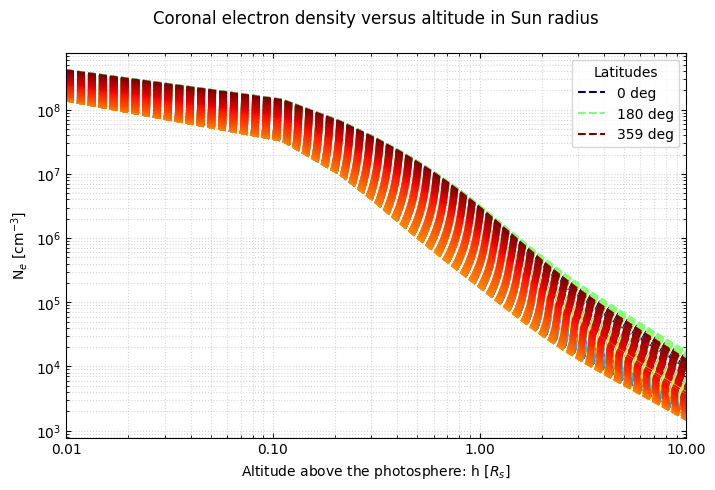

In [7]:
from matplotlib.ticker import ScalarFormatter
import matplotlib.cm as cm

plt.figure(figsize=(8, 5))

# Colormap
cmap = cm.get_cmap('jet', len(latitude))
norm = plt.Normalize(vmin=0, vmax=len(latitude)-1)

# Plot
for idx, i in enumerate(range(0, len(latitude), 1)):
    color = cmap(norm(idx))
    if i == 0 or i == int(len(latitude)/2) or i == len(latitude)-1:
        plt.plot(h_values, ne_values[i], "--", label=f'{i} deg', color=color)
    else:
        plt.plot(h_values, ne_values[i], "--", color=color)

# Cosmetic
plt.title("Coronal electron density versus altitude in Sun radius\n")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Altitude above the photosphere: h [$R_s$]")
plt.ylabel("N$_e$ [cm$^{-3}$]")
plt.tick_params(direction="in", which="both", top = "True", right = "True")
plt.grid(True, which="both", linestyle=":", alpha = 0.5)

ax = plt.gca()
ax.xaxis.set_major_formatter(ScalarFormatter())
ax.ticklabel_format(useOffset=False, style='plain', axis='x')

plt.xlim(0.01,10)

# Legend
plt.legend(title = "Latitudes")
plt.rcParams['figure.dpi'] = 600  # set the image resolution at 600 DPI

# Save
output_subdir = "quants_vs_h"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/ne_vs_h.png"
plt.savefig(outfile, dpi=300)

In [8]:
u = []
u_values = []

for lat in range(len(latitude)):
    AE_Ar = (height[lat]/r)**2
    u_singleLat = uE[lat] * AE_Ar * nE[lat] / ne[lat]
    u.append(u_singleLat.subs(phi, latitude[lat]))
    u_values.append([u[lat].subs(r, h+1) for h in h_values])

In [9]:
du_dr = []
du_dr_values = []

for lat in range(len(latitude)):
    du_dr_singleLat = sp.diff(u[lat], r)
    du_dr.append(du_dr_singleLat)
    du_dr_values.append([du_dr[lat].subs(r, h+1) for h in h_values])

/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/1338287682.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet', len(latitude))


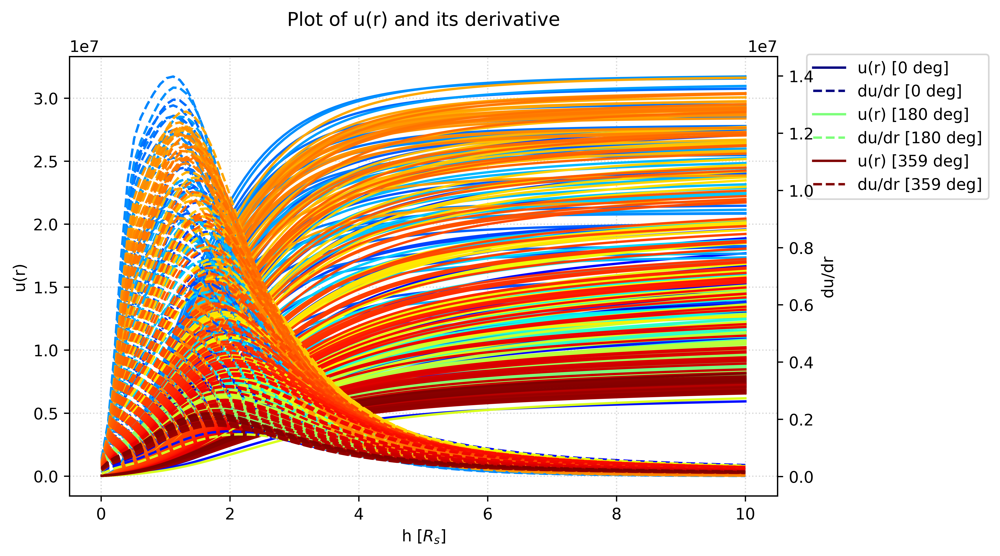

In [10]:
output_subdir = "quants_vs_h"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)

# Plot of u(r) with polar values, and its derivative
fig, ax1 = plt.subplots(figsize=(8, 5))
ax2 = ax1.twinx()

# Colormap
cmap = cm.get_cmap('jet', len(latitude))
norm = plt.Normalize(vmin=0, vmax=len(latitude)-1)

lines_for_legend = []

# Plot
for idx, i in enumerate(range(0, len(latitude), 1)):
    color = cmap(norm(idx))
    if i == 0 or i == int(len(latitude)/2) or i == len(latitude)-1:
        line1, = ax1.plot(h_values, u_values[i], "-", label=f'u(r) [{i} deg]', color = color)
        line2, = ax2.plot(h_values, du_dr_values[i], "--", label=f'du/dr [{i} deg]', color = color)
        lines_for_legend.extend([line1, line2])  # aggiungi alla lista
    else:
        line1, = ax1.plot(h_values, u_values[i], "-", color = color)
        line2, = ax2.plot(h_values, du_dr_values[i], "--", color = color)        
    
ax1.set_xlabel('h [$R_s$]')
ax1.set_ylabel('u(r)')
ax2.set_ylabel('du/dr')

ax1.set_title('Plot of u(r) and its derivative\n')
ax1.grid(True, which="both", linestyle=":", alpha = 0.5)
#ax2.grid(True, which="both", linestyle=":", alpha = 0.5)

ax1.legend(lines_for_legend, 
           [line.get_label() for line in lines_for_legend], 
           loc='center left', 
           bbox_to_anchor=(1.03, 0.84))
plt.rcParams['figure.dpi'] = 600  # set the image resolution at 600 DPI

# Save
outfile = f"{output_dir}/{output_subdir}/u_vs_h.png"
plt.savefig(outfile, dpi=300)

In [11]:
from astropy.constants import R_sun
from astropy import units

gS = 2.74e4  # [cm/s^2]
Rsun_cm = R_sun.to(units.cm).value  # Solar radius in centimeters (float)

F = []
F_values = []

for lat in range(len(latitude)):
    F_singleLat = (1 / (gS * Rsun_cm)) * r**2 * u[lat] * du_dr[lat]
    F.append(F_singleLat)
    F_values.append([F[lat].subs(r, h+1) for h in h_values])

/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/199809030.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet', len(latitude))


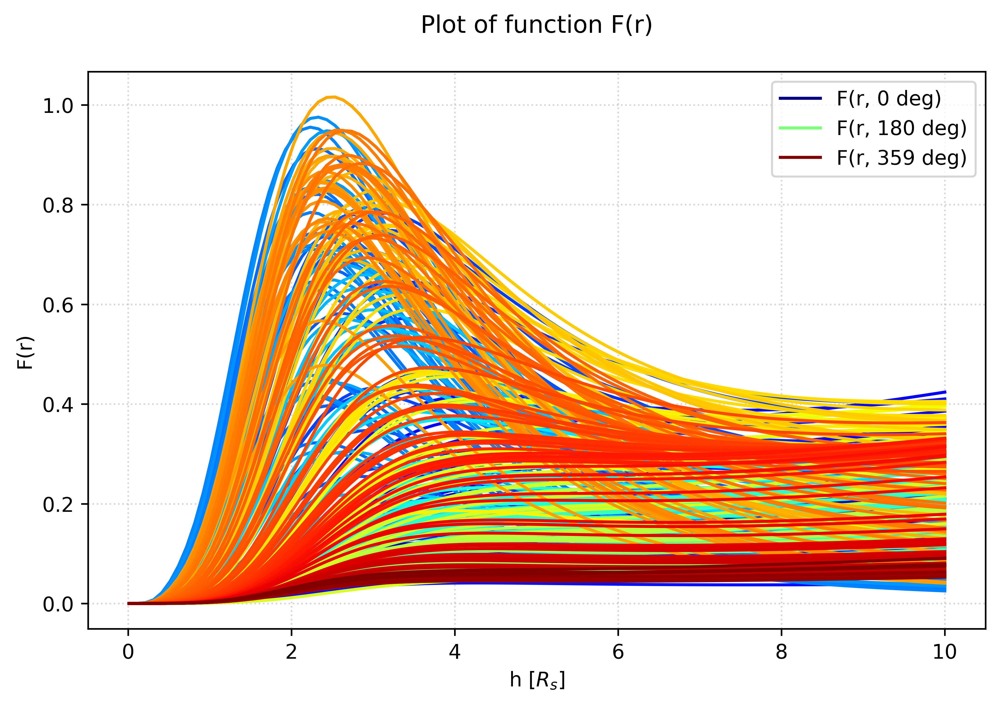

In [12]:
# E.g., plot of F(r) with polar values
fig, ax1 = plt.subplots(figsize=(8, 5))

# Colormap
cmap = cm.get_cmap('jet', len(latitude))
norm = plt.Normalize(vmin=0, vmax=len(latitude)-1)

# Plot
for idx, i in enumerate(range(0, len(latitude), 1)):
    color = cmap(norm(idx))
    if i == 0 or i == int(len(latitude)/2) or i == len(latitude)-1:
        ax1.plot(h_values, F_values[i], "-", label=f'F(r, {i} deg)', color = color)
    else:
        ax1.plot(h_values, F_values[i], "-", color = color)

ax1.set_xlabel('h [$R_s$]')
ax1.set_ylabel('F(r)')

ax1.set_title('Plot of function F(r)\n')
ax1.grid(True, which="both", linestyle=":", alpha = 0.5)
ax1.legend()
plt.rcParams['figure.dpi'] = 600  # set the image resolution at 600 DPI

# Save
output_subdir = "quants_vs_h"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/F_vs_h.png"
plt.savefig(outfile, dpi=300)

In [13]:
# Normalization temperature

mu = 0.5           # Ratio mi/mp (if the gas is fully ionized hydrogen) [see Page 6 of 25 in REF_1]
mH = 1.67e-27      # Mass of hydrogen atom [kg]
kb = 1.380649e-19  # Boltzmann constant [cm^2 kg / s^2 K]

T_star = mu*gS*Rsun_cm*mH/kb  # = 1.15e+07 K
#T_star = 13e6  # K [i.e., Ref_1]
#T_star = 17e6  # K [i.e., Ref_2]
print("T* = {0:.2e} K".format(T_star))

T* = 1.15e+07 K


In [15]:
from scipy.integrate import quad
from mpmath import quad, inf

T_differentLat = []
print(f"Latitude (/{len(latitude)}):")

for lat in range(len(latitude)):
    print(f"{lat} ", end='')  # stampa l'indice iniziale senza andare a capo
    if (lat+1) % 25 == 0:
        print()  # a capo ogni 10 valori
    integrand = (ne[lat] / r**2) * (1 + F[lat])
    func = sp.lambdify(r, integrand, modules='scipy')
    T_singleLat = [-float(quad(func, [inf, r_extreme+1])) * T_star/float(ne[lat].subs(r,r_extreme+1)) for r_extreme in h_values]
    
    T_differentLat.append(T_singleLat)

Latitude (/360):
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 
25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 
50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 
75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 
100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 
125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 
150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 
175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 
200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 
225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 
250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270

/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/3998715039.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet', len(latitude))


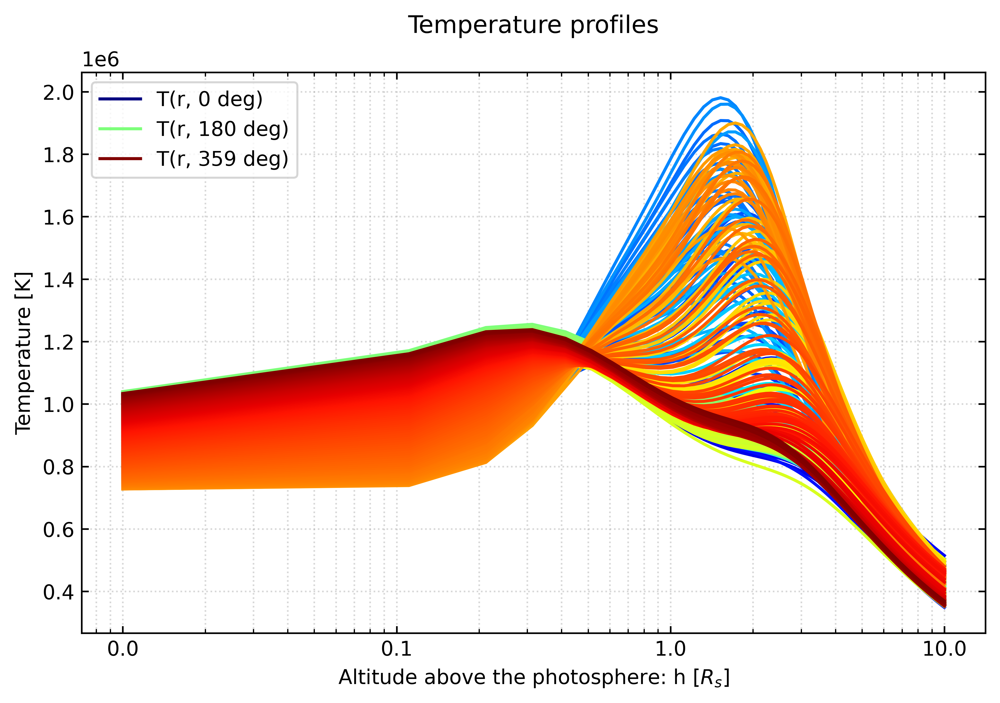

In [16]:
plt.figure(figsize=(8, 5))

# Colormap
cmap = cm.get_cmap('jet', len(latitude))
norm = plt.Normalize(vmin=0, vmax=len(latitude)-1)

# Plot
for idx, i in enumerate(range(0, len(latitude), 1)):
    color = cmap(norm(idx))
    if i == 0 or i == int(len(latitude)/2) or i == len(latitude)-1:
        plt.plot(h_values, T_differentLat[i], "-", label=f'T(r, {i} deg)', color = color)
    else:
        plt.plot(h_values, T_differentLat[i], "-", color = color)
        
# Cosmetic
plt.title("Temperature profiles\n")
plt.xscale("log")
plt.xlabel("Altitude above the photosphere: h [$R_s$]")
plt.ylabel("Temperature [K]")
plt.tick_params(direction="in", which="both", top = "True", right = "True")
plt.grid(True, which="both", linestyle=":", alpha = 0.5)

ax = plt.gca()
ax.xaxis.set_major_formatter(ScalarFormatter())
ax.ticklabel_format(useOffset=False, style='plain', axis='x')

# Legend
plt.legend()
plt.rcParams['figure.dpi'] = 600  # set the image resolution at 600 DPI

# Save
output_subdir = "quants_vs_h"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/T_vs_h.png"
plt.savefig(outfile, dpi=300)

Temperature map PNG saved in output/Step1/temp_map/temperature_map.png
Temperature map FITS saved in output/Step1/temperature_map.fits


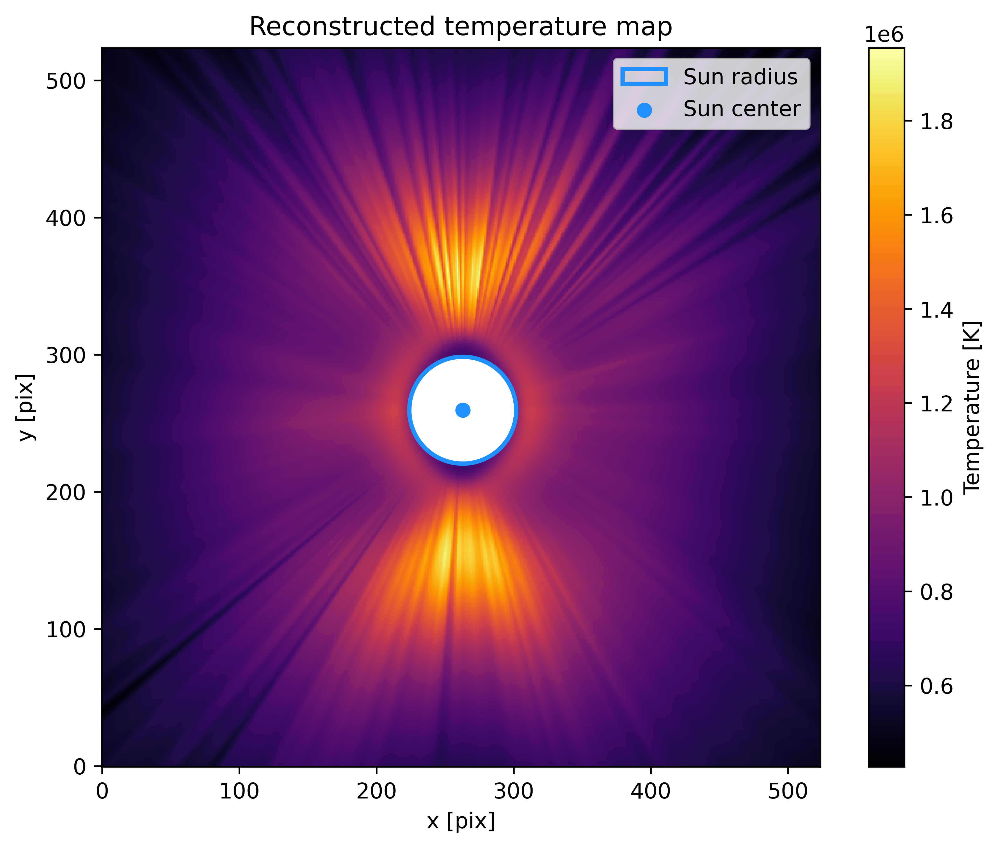

In [20]:
from scipy.interpolate import griddata
import matplotlib.patches as patches

# -----------------------------
# INPUT
# -----------------------------
original_map_shape = (vel_data.shape[0], vel_data.shape[1])
cx, cy = vel_header["XCEN"], vel_header["YCEN"]  # pixel center
latitude_vec = np.array(latitude)       # in rad
h_values = np.array(h_values)           # altitude above photosphere, Rsun
T_differentLat = np.array(T_differentLat)

# Conversione Rsun -> pixel
# Devi usare lo stesso Rsun in pixel della mappa originale
Rsun_pixels = (den_header['RSUN_ARC'] / den_header['CDELT1']) / 2  # /2 perché hai fatto binning 2x2

# -----------------------------
# 1️⃣ Creiamo coordinate cartesiane dei punti
# -----------------------------
x_points = []
y_points = []
T_points = []

for i, lat in enumerate(latitude_vec):
    for j, h in enumerate(h_values):
        r_pix = (h + 1) * Rsun_pixels  # distanza dal centro in pixel
        x = cx + r_pix * np.cos(lat)
        y = cy + r_pix * np.sin(lat)
        x_points.append(x)
        y_points.append(y)
        T_points.append(T_differentLat[i, j])

x_points = np.array(x_points)
y_points = np.array(y_points)
T_points = np.array(T_points)

# -----------------------------
# 2️⃣ Griglia della mappa originale
# -----------------------------
ny, nx = original_map_shape
grid_x, grid_y = np.meshgrid(np.arange(nx), np.arange(ny))

# -----------------------------
# 3️⃣ Interpolazione sulla griglia
# -----------------------------
T_map = griddata(
    points=(x_points, y_points),
    values=T_points,
    xi=(grid_x, grid_y),
    method='linear'   # 'nearest' per riempire anche i pixel vuoti
)

# -----------------------------
# 4️⃣ Plot
# -----------------------------
plt.figure(figsize=(8,6))

# Show solar limb
yy, xx = np.indices(T_map.shape)
r_from_center = np.sqrt((xx - cx)**2 + (yy - cy)**2)

# Copia per FITS
T_map_fits = T_map.copy()
T_map_fits[r_from_center < Rsun_pixels] = np.nan  # valori all'interno del Sole

# Mappa
im = plt.imshow(T_map_fits, origin='lower', cmap='inferno')

# Cerchio della fotosfera
circle = patches.Circle((cx, cy), Rsun_pixels, edgecolor='dodgerblue',
                        facecolor='none', linewidth=2, label='Sun radius')
plt.gca().add_patch(circle)

# Centro del Sole
plt.scatter(cx, cy, color='dodgerblue', marker='o', label='Sun center')

plt.xlabel("x [pix]")
plt.ylabel("y [pix]")
plt.colorbar(im, label='Temperature [K]')
plt.title("Reconstructed temperature map")
plt.legend()

# -----------------------------
# 5️⃣ Salvataggio
# -----------------------------
output_subdir = "temp_map"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/temperature_map.png"
plt.savefig(outfile, dpi=300)
print(f"Temperature map PNG saved in {outfile}")

# -----------------------------
# 6️⃣ Salvataggio FITS
# -----------------------------
from astropy.io import fits

# Copia dell'header originale
temp_header = hdul_vel[0].header.copy()

# Aggiornamento keyword
temp_header['BTYPE'] = 'Temperature'
temp_header['BUNIT'] = 'K'
temp_header['COMMENT'] = 'Temperature map reconstructed from DYN model'
temp_header['FILE_NME'] = 'TemperatureMap'

# Creiamo l'HDU
hdu_temp = fits.PrimaryHDU(data=T_map_fits.astype(np.float32),
                           header=temp_header)

# Scrittura su file
fits_outfile = f"{output_dir}/temperature_map.fits"
hdu_temp.writeto(fits_outfile, overwrite=True)

print(f"Temperature map FITS saved in {fits_outfile}")

plt.show()

/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/4024616062.py:20: RuntimeWarning: invalid value encountered in divide
  T_map_smooth = T_smooth_num / T_smooth_den


Temperature map PNG saved in output/Step1/temp_map/temperature_map_smoothed.png


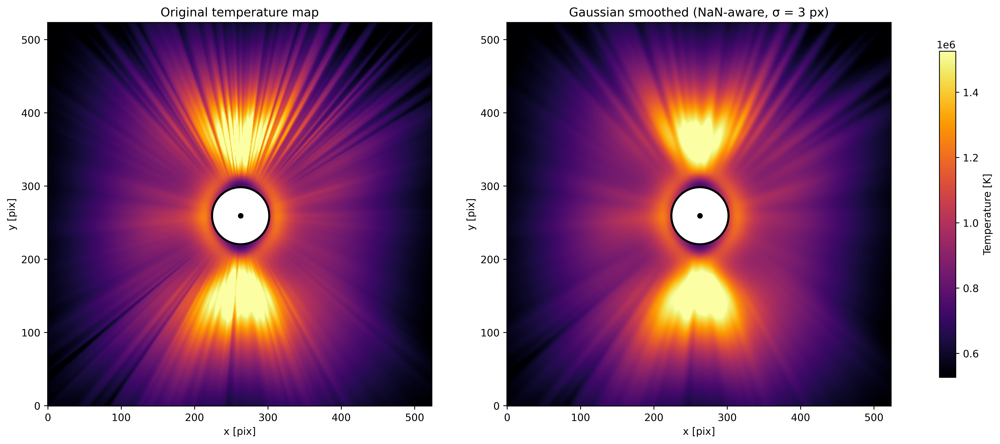

In [22]:
from scipy.ndimage import gaussian_filter

# -----------------------------
# NaN-aware Gaussian smoothing
# -----------------------------
sigma = 3  # smoothing scale in pixels
valid_mask = np.isfinite(T_map_fits)

# Data with NaNs replaced by 0
T_filled = np.where(valid_mask, T_map_fits, 0.0)

# Gaussian filter on data and mask
T_smooth_num = gaussian_filter(T_filled, sigma=sigma)
T_smooth_den = gaussian_filter(valid_mask.astype(float), sigma=sigma)

# Normalized result
T_map_smooth = T_smooth_num / T_smooth_den
T_map_smooth[~valid_mask] = np.nan

# -----------------------------
# Common color scale
# -----------------------------
vmin = np.nanpercentile(T_map_fits, 2)
vmax = np.nanpercentile(T_map_fits, 98)

# -----------------------------
# Plot: before / after
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True)

titles = [
    "Original temperature map",
    f"Gaussian smoothed (NaN-aware, σ = {sigma} px)"
]

maps = [T_map_fits, T_map_smooth]

for ax, data, title in zip(axes, maps, titles):

    im = ax.imshow(
        data,
        origin='lower',
        cmap='inferno',
        vmin=vmin,
        vmax=vmax
    )

    # Solar limb
    circle = patches.Circle(
        (cx, cy),
        Rsun_pixels,
        edgecolor='black',
        facecolor='none',
        linewidth=2
    )
    ax.add_patch(circle)

    # Sun center
    ax.scatter(cx, cy, color='black', s=20)

    ax.set_title(title)
    ax.set_xlabel("x [pix]")
    ax.set_ylabel("y [pix]")
    #ax.set_axis_off()

# Colorbar
cbar = fig.colorbar(im, ax=axes, shrink=0.85)
cbar.set_label("Temperature [K]")

# -----------------------------
# Salvataggio
# -----------------------------
output_subdir = "temp_map"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/temperature_map_smoothed.png"

plt.savefig(outfile, dpi=300)
print(f"Temperature map PNG saved in {outfile}")

plt.show()

/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/2452734634.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet', len(radii_Rsun))


Temperature map PNG saved in output/Step1/temp_map/temperature_map_circles.png


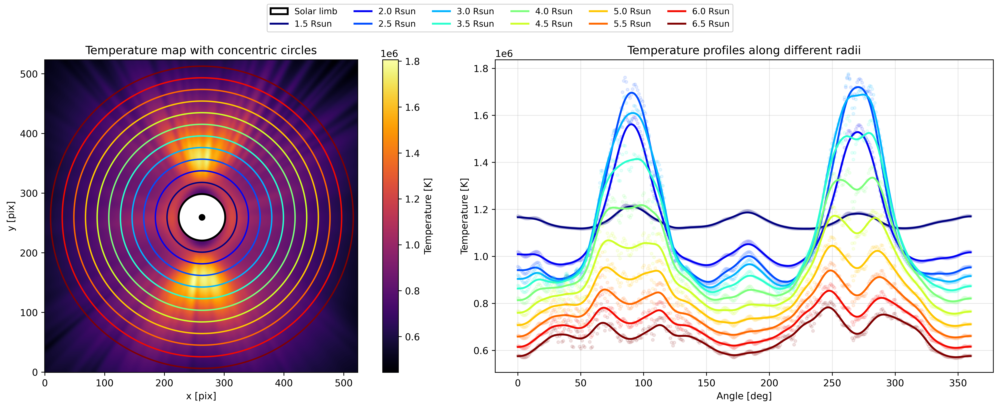

Saved temperature profiles for all radii in output/Step1/temperature_profiles.txt


In [26]:
from scipy.ndimage import map_coordinates, gaussian_filter1d

# -----------------------------
# PARAMETRI
# -----------------------------
T_map_use = T_map_smooth  # mappa di temperatura (smoothed)
ny, nx = T_map_use.shape

# Raggi in Rsun da 1.5 fino a max consentito
r_min_Rsun = 1.5   # Rsun
r_max_pix = min(cx, cy, nx-1-cx, ny-1-cy) # pixel
r_max_Rsun = r_max_pix / Rsun_pixels
r_step_Rsun = 0.5  # Rsun
radii_Rsun = np.arange(r_min_Rsun, r_max_Rsun, r_step_Rsun)

n_angles = 360  # deg
theta = np.linspace(0, 2*np.pi, n_angles)
theta_deg = theta * 180/np.pi
sigma_smooth = 5  # sigma per gaussian_filter 1D

# Colormap per le curve
cmap = cm.get_cmap('jet', len(radii_Rsun))

# -----------------------------
# Lista per salvare tutti i profili
# -----------------------------
all_profiles = []
all_radials = []

# -----------------------------
# Preparazione figure
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# -----------------------------
# 1️⃣ Mappa con cerchi
# -----------------------------
im0 = axes[0].imshow(T_map_use, origin='lower', cmap='inferno')
axes[0].scatter(cx, cy, color='black', marker='o', label='Sun center')

# Cerchio della fotosfera (solar limb)
circle_limb = patches.Circle((cx, cy), Rsun_pixels, edgecolor='black', facecolor='none', linewidth=2)
axes[0].add_patch(circle_limb)

# -----------------------------
# 2️⃣ Profili lungo i cerchi
# -----------------------------
legend_handles = [circle_limb]  # for legend of solar limb
legend_labels = ['Solar limb']  # legend of solar limb

for i, r_solar in enumerate(radii_Rsun):
    
    #if r_solar == 2.:  # uncomment if you want to select a single distance from the Sun center [1 Rsun = solar limb]
        
        r_fixed = r_solar * Rsun_pixels
    
        # Coordinate del cerchio
        x_circle = cx + r_fixed * np.cos(theta)
        y_circle = cy + r_fixed * np.sin(theta)
    
        # Estrazione valori lungo il cerchio
        T_circle = map_coordinates(T_map_use, [y_circle, x_circle], order=1, mode='nearest')
    
        # Smoothing
        T_circle_smooth = gaussian_filter1d(T_circle, sigma=sigma_smooth)
        all_profiles.append(T_circle_smooth.tolist())  # salva come lista
        all_radials.append(float(r_solar))  # salva come lista
    
        # Cerchio sulla mappa
        circle_profile = patches.Circle((cx, cy), r_fixed, edgecolor=cmap(i), facecolor='none', linewidth=1.5)
        axes[0].add_patch(circle_profile)
    
        # Profilo a destra
        axes[1].plot(theta_deg, T_circle, ".", lw=1.5, label='Data', color=cmap(i), alpha = 0.10)
        line_profile, = axes[1].plot(theta_deg, T_circle_smooth, color=cmap(i), lw=2)
    
        # Aggiungiamo alla legenda
        legend_handles.append(line_profile)
        legend_labels.append(f'{r_solar:.1f} Rsun')

# -----------------------------
# Impostazioni finali plot
# -----------------------------
axes[0].set_title("Temperature map with concentric circles")
axes[0].set_xlabel("x [pix]")
axes[0].set_ylabel("y [pix]")
plt.colorbar(im0, ax=axes[0], label='Temperature [K]')

axes[1].set_xlabel('Angle [deg]')
axes[1].set_ylabel('Temperature [K]')
axes[1].set_title('Temperature profiles along different radii')
axes[1].grid(True, alpha=0.3)

# Legenda unica in alto al centro
fig.legend(handles=legend_handles, labels=legend_labels, loc='upper center', ncol=6, fontsize=9)
plt.tight_layout(rect=[0, 0, 1, 0.92])  # lascia spazio sopra per la legenda

# -----------------------------
# Salvataggio
# -----------------------------
output_subdir = "temp_map"
os.makedirs(f"{output_dir}/{output_subdir}", exist_ok=True)
outfile = f"{output_dir}/{output_subdir}/temperature_map_circles.png"

plt.savefig(outfile, dpi=300)
print(f"Temperature map PNG saved in {outfile}")

plt.show()

# -----------------------------
# Salvataggio su file di testo
# -----------------------------
outfile = f"{output_dir}/temperature_profiles.txt"

with open(outfile, 'w') as f:
    f.write(f"r(Rsun) = {all_radials}\n")
    f.write(f"T(K) = {all_profiles}\n")

print(f"Saved temperature profiles for all radii in {outfile}")

---

In [40]:
import os
import ast
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# -----------------------------
# PARAMETRI
# -----------------------------
base_dir = "output"
n_angles = 360
theta_deg = np.linspace(0, 360, n_angles)

# -----------------------------
# Trova tutte le cartelle Step*
# -----------------------------
step_dirs = sorted([
    d for d in os.listdir(base_dir)
    if d.startswith("Step") and os.path.isdir(os.path.join(base_dir, d))
])

print(f"Number of Steps: {len(step_dirs)}")
print(step_dirs)

# -----------------------------
# Leggiamo una volta sola i raggi disponibili
# -----------------------------
ref_file = os.path.join(base_dir, step_dirs[0], "temperature_profiles.txt")

with open(ref_file, "r") as f:
    lines = f.readlines()

r_values = ast.literal_eval(lines[0].split("=", 1)[1].strip())
n_radii = len(r_values)

print(f"Available radii (Rsun): {r_values}")

# -----------------------------
# Colormap: un colore per Step
# -----------------------------
cmap = cm.get_cmap("jet", len(step_dirs))

# -----------------------------
# Loop su tutti i raggi
# -----------------------------
for profile_index in range(n_radii):

    r_selected = r_values[profile_index]

    plt.figure(figsize=(10, 6))

    # -----------------------------
    # Loop sugli Step
    # -----------------------------
    for i, step in enumerate(step_dirs):

        file_path = os.path.join(base_dir, step, "temperature_profiles.txt")

        if not os.path.exists(file_path):
            print(f"Missing file: {file_path}")
            continue

        with open(file_path, "r") as f:
            lines = f.readlines()

        T_values = ast.literal_eval(lines[1].split("=", 1)[1].strip())
        T_selected = np.array(T_values[profile_index])

        plt.plot(
            theta_deg,
            T_selected,
            lw=2,
            color=cmap(i),
            label=step
        )

    # -----------------------------
    # Finalizzazione plot
    # -----------------------------
    plt.xlabel("Angle [deg]")
    plt.ylabel("Temperature [K]")
    plt.title(f"Temperature profiles at r = {r_selected:.1f} Rsun")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # -----------------------------
    # Salvataggio
    # -----------------------------
    output_dir = f"output/iteration"
    os.makedirs(output_dir, exist_ok=True)
    outfile = f"{output_dir}/temperature_iteration_r_{r_selected:.1f}Rsun.png"
    plt.savefig(outfile, dpi=300)
    print(f"Saved: {outfile}")

    plt.close()

Number of Steps: 2
['Step0', 'Step1']
Available radii (Rsun): [1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5]
Saved: output/iteration/temperature_iteration_r_1.5Rsun.png


/var/folders/sm/6r_l839d41v7yp0yhlc8nzhw0000gn/T/ipykernel_34190/2610296351.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet", len(step_dirs))


Saved: output/iteration/temperature_iteration_r_2.0Rsun.png
Saved: output/iteration/temperature_iteration_r_2.5Rsun.png
Saved: output/iteration/temperature_iteration_r_3.0Rsun.png
Saved: output/iteration/temperature_iteration_r_3.5Rsun.png
Saved: output/iteration/temperature_iteration_r_4.0Rsun.png
Saved: output/iteration/temperature_iteration_r_4.5Rsun.png
Saved: output/iteration/temperature_iteration_r_5.0Rsun.png
Saved: output/iteration/temperature_iteration_r_5.5Rsun.png
Saved: output/iteration/temperature_iteration_r_6.0Rsun.png
Saved: output/iteration/temperature_iteration_r_6.5Rsun.png


---